In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# json 파일 보고 싶을 때
file_path = "/content/Semiconductor-Defect-Detection-2/test/_annotations.coco.json"

with open(file_path, 'r') as file:
    contents = file.read()
    print(contents)

{"info":{"year":"2023","version":"2","description":"Exported from roboflow.ai","contributor":"","url":"https://public.roboflow.ai/object-detection/undefined","date_created":"2023-07-15T16:42:00+00:00"},"licenses":[{"id":1,"url":"https://creativecommons.org/licenses/by/4.0/","name":"CC BY 4.0"}],"categories":[{"id":0,"name":"semiconductor-defects","supercategory":"none"},{"id":1,"name":"bdot","supercategory":"semiconductor-defects"},{"id":2,"name":"bline1","supercategory":"semiconductor-defects"},{"id":3,"name":"bline2","supercategory":"semiconductor-defects"},{"id":4,"name":"bline3","supercategory":"semiconductor-defects"},{"id":5,"name":"bline4","supercategory":"semiconductor-defects"},{"id":6,"name":"bline5","supercategory":"semiconductor-defects"},{"id":7,"name":"bline6","supercategory":"semiconductor-defects"},{"id":8,"name":"break","supercategory":"semiconductor-defects"},{"id":9,"name":"circle","supercategory":"semiconductor-defects"},{"id":10,"name":"pattern_1","supercategory":"

In [ ]:
!pip install -i https://test.pypi.org/simple/ supervision==0.3.0
!pip install -q transformers
!pip install -q pytorch-lightning
!pip install -q roboflow
!pip install -q timm

Looking in indexes: https://test.pypi.org/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 16.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 20.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 41.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 43.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 722.8/722.8 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 729.2/729.2 kB 9.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.4/57.4 kB 1.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.3/155.3 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 2.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 2.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 4.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━

In [1]:
import torch
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)

import roboflow
import supervision as sv
import transformers
import pytorch_lightning
import cv2

print(
    "roboflow:", roboflow.__version__,
    "; supervision:", sv.__version__,
    "; transformers:", transformers.__version__,
    "; pytorch_lightning:", pytorch_lightning.__version__,
    "; OpenCV:", cv2.__version__
)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Wed_Sep_21_10:33:58_PDT_2022
Cuda compilation tools, release 11.8, V11.8.89
Build cuda_11.8.r11.8/compiler.31833905_0
torch:  2.0 ; cuda:  cu118
roboflow: 1.1.2 ; supervision: 0.3.0 ; transformers: 4.31.0 ; pytorch_lightning: 2.0.6 ; OpenCV: 4.7.0


In [ ]:
# from getpass import getpass   # 파이썬(Python) 프로그래밍 언어에서 사용자로부터 비밀번호를 안전하게 입력받기 위해 사용되는 라이브러리와 함수입니다.

# ROBOFLOW_API_KEY = getpass('Enter ROBOFLOW_API_KEY secret value: ')   # 변수에 비밀번호 저장됨

Enter ROBOFLOW_API_KEY secret value: ··········


In [2]:
# !pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="R7Sv3XZ9Wk5orzpjlsLw")
project = rf.workspace("data-universe").project("semiconductor-defect-detection")
dataset = project.version(45).download("coco")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Semiconductor-Defect-Detection-45 in coco:: 100%|██████████| 1024/1024 [00:01<00:00, 859.79it/s]


In [ ]:
# # 데이터 세트 클래스의 위치 속성 - 데이터 세트 위치 찾기
# dataset.location

'/content/Semiconductor-Defect-Detection-43'

# Create COCO data loaders
- COCO 데이터셋을 다루기 위한 CocoDetection 클래스를 정의하고, DE:TR(Detection Transformer) 모델에 입력으로 사용하기 위해 데이터를 전처리하는 코드

## torchvision.datasets.CocoDetection
- 컴퓨터 비전 관련 작업을 위한 유틸리티와 데이터셋을 제공하는 패지키
- torchvision.datasets - 다양한 공개 데이터셋에 대한 데이터 로더를 제공함 (CIFAR, MNIST, ImageNet, COCO), 미리 정의된 로더를 사용하여 데이터를 손쉽게 로드할 수 있음
- torchvision.transforms - 데이터 전처리 작업을 쉽게 수행해주는 모듈
- torchvision.models - 이미지 분류, 객체 감지, 세분화 등과 같은 다양한 작업을 위한 사전 학습된 딥러닝 모델들을 제공, 모델 관련 유틸리티 함수들도 포함되어 있음
- torchvision.utils - 이미지, 비디오, 그리드 등과 같은 비전 작업을 위한 유틸리티 함수들을 포함

## from transformers import DetrForObjectDetection, DetrImageProcessor
- transformers
- DetrForObjectDetection
- DetrImageProcessor

##

이 코드는 COCO 데이터셋(COCO Detection)을 PyTorch의 torchvision.datasets.CocoDetection 클래스를 확장하여 사용자 정의 데이터셋을 만드는 역할을 합니다. COCO 데이터셋은 객체 감지(object detection) 작업에 널리 사용되는 대형 데이터셋 중 하나로, 다양한 객체 카테고리에 대한 이미지와 각 객체에 대한 바운딩 박스 정보를 제공합니다.

객체 감지 모델을 학습하기 위해서는 입력 이미지와 해당 이미지에서 발견된 객체에 대한 레이블 정보가 필요합니다. COCO 데이터셋은 이미지 파일들과 그에 해당하는 바운딩 박스 정보를 JSON 형태의 annotation 파일로 제공하며, 이를 활용하여 객체 감지 모델을 학습할 수 있습니다.

이 코드에서 주요 역할은 다음과 같습니다:

CocoDetection 클래스:

torchvision.datasets.CocoDetection 클래스를 상속하여 사용자 정의 데이터셋을 만듭니다.
__init__ 메서드에서 COCO 데이터셋의 이미지 디렉토리 경로와 annotation 파일의 경로를 받아와 초기화합니다.
__getitem__ 메서드를 오버라이드하여 데이터를 로드하고 가공합니다.
이미지를 불러와서 주어진 image_processor 함수를 사용하여 이미지를 전처리합니다.
해당 이미지에 대한 객체의 바운딩 박스 정보(annotations)를 함께 가공하여 모델에 입력으로 사용합니다.
데이터셋 객체 생성:

TRAIN_DATASET, VAL_DATASET, TEST_DATASET 세 개의 데이터셋 객체를 생성합니다.
각각은 훈련용(train), 검증용(validation), 테스트용(test) 데이터를 나타냅니다.
데이터셋 생성 시, COCO 데이터셋의 이미지 디렉토리 경로와 이미지를 전처리하는 image_processor 함수를 인자로 전달합니다.
출력 정보:

생성된 데이터셋의 크기를 출력하여 각 데이터셋에 몇 개의 이미지가 있는지 확인합니다.
이렇게 만들어진 CocoDetection 클래스와 관련된 객체들은 PyTorch의 데이터 로더(DataLoader)를 사용하여 학습 또는 추론 시 모델에 적절한 형태로 데이터를 제공할 수 있습니다.

def __getitem__(self, idx)는 파이썬에서 특별한 메서드 중 하나로, 클래스의 인스턴스에 인덱싱([])을 적용할 때 호출되는 메서드입니다. CocoDetection 클래스는 torchvision.datasets.CocoDetection 클래스를 상속받았기 때문에, 이 클래스에는 이미 __getitem__ 메서드가 구현되어 있습니다. 하지만 CocoDetection 클래스에서는 이 메서드를 재정의(override)하여 추가적인 동작을 정의합니다.

__getitem__ 메서드는 데이터셋에서 특정 인덱스(idx)에 해당하는 데이터를 가져오는 역할을 합니다. 주로 데이터셋의 이미지와 해당 이미지의 레이블(타겟)을 반환하는 역할을 수행합니다.

위의 CocoDetection 클래스의 __getitem__ 메서드에서는 다음과 같은 작업을 수행합니다:

super(CocoDetection, self).__getitem__(idx): super()를 사용하여 부모 클래스인 torchvision.datasets.CocoDetection의 __getitem__ 메서드를 호출합니다. 이를 통해 COCO 데이터셋의 이미지와 어노테이션 정보를 가져옵니다. images에는 이미지 데이터, annotations에는 해당 이미지의 어노테이션 정보가 저장됩니다.

image_id = self.ids[idx]: self.ids는 COCO 데이터셋에서 각 이미지에 대한 고유한 식별자(ID) 정보를 가진 리스트입니다. idx에 해당하는 인덱스의 이미지에 대한 ID를 가져와 image_id 변수에 저장합니다.

annotations = {'image_id': image_id, 'annotations': annotations}: 이미지 ID와 해당 이미지의 어노테이션 정보를 딕셔너리 형태로 묶어 annotations 변수에 저장합니다.

데이터 전처리: self.image_processor를 사용하여 이미지와 어노테이션 정보를 전처리합니다. self.image_processor는 DetrImageProcessor 클래스의 인스턴스로 이미지를 DE:TR 모델의 입력 형식으로 변환하는 역할을 담당합니다. images와 annotations 정보를 인자로 전달하고, return_tensors="pt"를 설정하여 PyTorch 텐서 형식으로 결과를 반환받습니다.

결과 반환: 이미지와 레이블(타겟) 정보를 반환합니다. encoding에서 pixel_values는 전처리된 이미지 데이터이며, labels에는 객체 검출 결과 레이블이 포함되어 있습니다. 여기서 [0]을 사용하여 첫 번째 객체의 레이블만 가져옵니다.

이렇게 __getitem__ 메서드를 재정의함으로써, CocoDetection 클래스는 기존의 COCO 데이터셋에서 이미지와 레이블을 가져오는 동작에 추가적인 전처리 과정을 수행하여 DETR 모델에 적합한 형태로 데이터를 반환합니다.

In [5]:
# COCODETECTION class

import os
import torchvision
from transformers import DetrForObjectDetection, DetrImageProcessor    # Hugging Face Transformer 라이브버리 DETR모델

image_processor = DetrImageProcessor.from_pretrained('facebook/detr-resnet-50')        # 이미지를 DE:TR 모델의 입력 형식으로 전처리하는 데 사용되는 클래스
                                                                                       # 이미지 크기 조정, 픽셀 값 정규화, 어노테이션 형식 변환 등의 작업
                                                                                       # 사전 학습된 사중치를 사용하여 이미지 프로세서를 설정하게 됨

# 로보플로에서 직접 다운 받을 때 쓸 것
ANNOTATION_FILE_NAME = "_annotations.coco.json"
TRAIN_DIRECTORY = os.path.join(dataset.location, "train")
VAL_DIRECTORY = os.path.join(dataset.location, "valid")
TEST_DIRECTORY = os.path.join(dataset.location, "test")

# ANNOTATION_FILE_NAME = "_annotations.coco.json"
# TRAIN_DIRECTORY = '/content/Semiconductor-Defect-Detection-2/train'
# VAL_DIRECTORY = '/content/Semiconductor-Defect-Detection-2/valid'
# TEST_DIRECTORY = '/content/Semiconductor-Defect-Detection-2/test'


class CocoDetection(torchvision.datasets.CocoDetection):    # Common Objects in Context 데이터셋을 다루기 위한 클래스을 상속하여 새로운 클래스로 정의(기능 추가, 수정 등을 위해)
    def __init__(   # 클래스를 초기화
        self,
        image_directory_path: str,
        image_processor,    # 이미지를 DE:TR 모델의 입력 형식으로 전처리하는 데 사용되는 클래스
        train
        # train: bool = True  # 데이터셋이 학습용인지 테스트용인지를 지정하는 플래그
    ):
        annotation_file_path = os.path.join(image_directory_path, ANNOTATION_FILE_NAME)
        super(CocoDetection, self).__init__(image_directory_path, annotation_file_path)    # 부모 클래스의 생성자를 호출하여 초기화 -> 부모 클래스 기능 그대로 상속 + 기능 추가
        self.image_processor = image_processor

    def __getitem__(self, idx):    # 클래스의 인스턴스에 인덱싱('[]')을 적용할 때 호출되는 메서드
        images, annotations = super(CocoDetection, self).__getitem__(idx)   # 이 메서드를 재정의하여 추가적인 동작 정의함
        image_id = self.ids[idx]    # 데이터셋에서 특정 인덱스('idx')에 해당하는 데이터를 가져오는 역할을 함
        annotations = {'image_id': image_id, 'annotations': annotations}

        # 데이터 전처리 해주어야 함
        encoding = self.image_processor(images=images, annotations=annotations, return_tensors="pt")    # 전처리 결과를 PyTorch tensor 형식으로 반환함
        pixel_values = encoding["pixel_values"].squeeze()   # 전처리된 이미지가 encoding["pixel_values"] 필드에 저장되어 있음,
                                                            # squeeze() 메서드는 차원이 1인 차원을 모두 제거하고, 텐서의 형태를 변경하는 역할을 함,
                                                            # 이로 인해 pixel_values는 이미지의 픽셀값을 담은 3차원 텐서가 됨
        target = encoding["labels"][0]  # 객체 검출 결과 레이블, encodint['labels']는 개체 검출 결과 레이블을 텐서 형식으로 나타낸 것이며,
                                        # 여기서 [0]을 사용하여 첫 번째 객체의 레이블만 가져옴(클래스 레이블 정보로, 추적 및 분류 작업에 사용됨)
        return pixel_values, target     # DE:TR 모델의 학습과 추론에 이 전처리된 데이터가 사용됨 (입력 이미지와 객체 검출 결과 레이블로)


TRAIN_DATASET = CocoDetection(
    image_directory_path=TRAIN_DIRECTORY,
    image_processor=image_processor,
    train=True)
VAL_DATASET = CocoDetection(
    image_directory_path=VAL_DIRECTORY,
    image_processor=image_processor,
    train=False)
TEST_DATASET = CocoDetection(
    image_directory_path=TEST_DIRECTORY,
    image_processor=image_processor,
    train=False)

print("Number of training examples:", len(TRAIN_DATASET))
print("Number of validation examples:", len(VAL_DATASET))
print("Number of test examples:", len(TEST_DATASET))

loading annotations into memory...
Done (t=0.15s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.04s)
creating index...
index created!
Number of training examples: 776
Number of validation examples: 59
Number of test examples: 181


In [ ]:
TEST_DATASET[33]

(tensor([[[-1.4158, -1.4329, -1.4329,  ..., -1.1075, -1.0904, -1.0904],
          [-1.4843, -1.4843, -1.5014,  ..., -1.1075, -1.1247, -1.1075],
          [-1.5185, -1.5014, -1.5014,  ..., -1.1075, -1.1247, -1.1247],
          ...,
          [-1.1418, -1.1932, -1.2103,  ..., -1.0390, -1.0390, -1.0390],
          [-1.1589, -1.1760, -1.1932,  ..., -1.0219, -1.0390, -1.0562],
          [-1.1247, -1.1247, -1.1418,  ..., -1.0048, -1.0219, -1.0390]],
 
         [[-1.0203, -1.0378, -1.0378,  ..., -1.0903, -1.1253, -1.1253],
          [-1.0903, -1.0903, -1.1078,  ..., -1.0728, -1.1253, -1.1429],
          [-1.1429, -1.1253, -1.1429,  ..., -1.0728, -1.1078, -1.1253],
          ...,
          [-0.7402, -0.7752, -0.8102,  ..., -0.6527, -0.6527, -0.6527],
          [-0.7927, -0.7927, -0.7927,  ..., -0.6176, -0.6352, -0.6527],
          [-0.7752, -0.7577, -0.7577,  ..., -0.6001, -0.6176, -0.6352]],
 
         [[-0.4450, -0.4624, -0.4973,  ..., -0.4798, -0.4973, -0.4973],
          [-0.5147, -0.5147,

Image #209


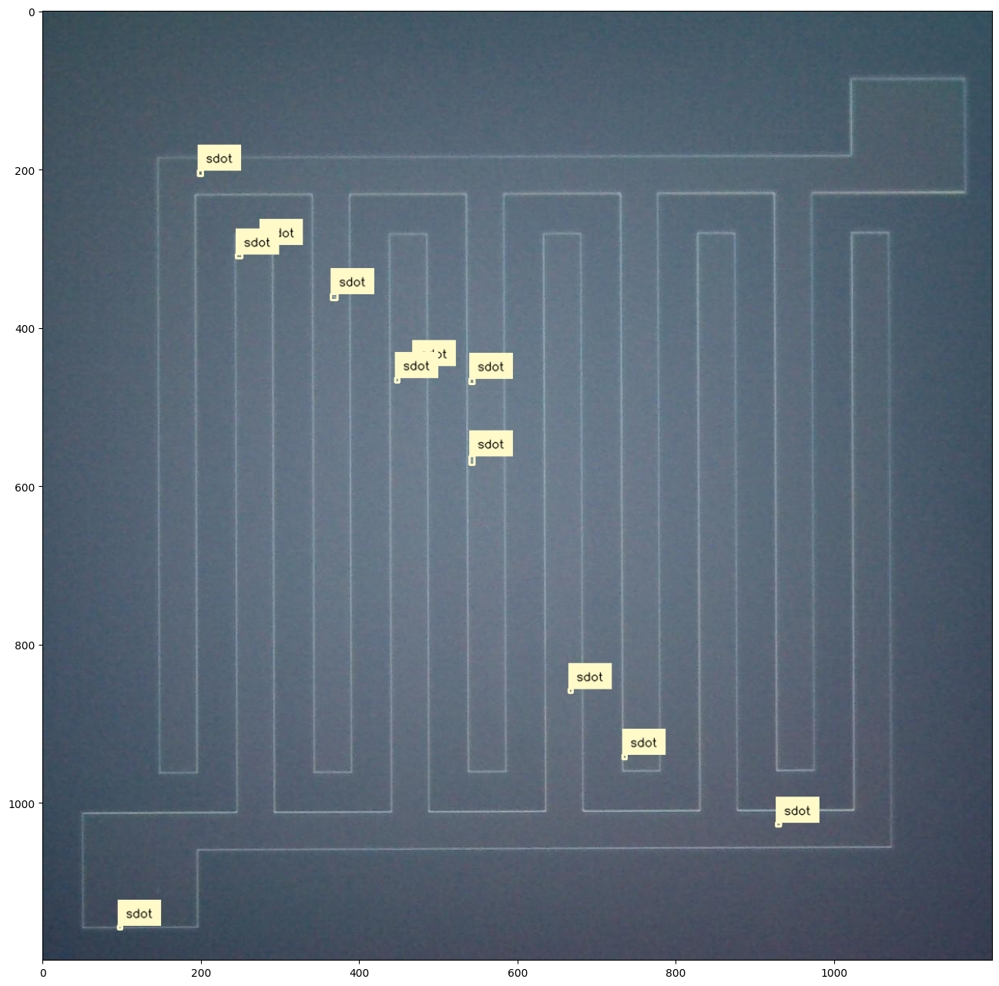

In [6]:
## Visualize data entry

import random
import cv2
import numpy as np

# select random image
image_ids = TRAIN_DATASET.coco.getImgIds()
image_id = random.choice(image_ids)
print('Image #{}'.format(image_id))

# load image and annotatons
image = TRAIN_DATASET.coco.loadImgs(image_id)[0]
annotations = TRAIN_DATASET.coco.imgToAnns.get(image_id, [])  # Add a default empty list if annotations are not available
image_path = os.path.join(TRAIN_DATASET.root, image['file_name'])
image = cv2.imread(image_path)

# we will use id2label function for training
categories = TRAIN_DATASET.coco.cats
id2label = {k: v['name'] for k,v in categories.items()}

# annotate -> 우리가 넣은 데이터에는 bounding box가 없는 데이터도 있어서 이렇게 설정해 줘야 함
if annotations:
    detections = sv.Detections.from_coco_annotations(coco_annotation=annotations)
    labels = [
        f"{id2label[class_id]}"
        for _, _, class_id, _
        in detections
    ]
else:
    detections = []
    labels = []

box_annotator = sv.BoxAnnotator()
frame = box_annotator.annotate(scene=image, detections=detections, labels=labels)

%matplotlib inline
sv.show_frame_in_notebook(image, (16, 16))


ValueError: xyxy must be 2d np.ndarray with (n, 4) shape, confidence must be None or 1d np.ndarray with (n,) shape, class_id must be 1d np.ndarray with (n,) shape, tracker_id must be None or 1d np.ndarray with (n,) shape<br><br>



<br><br>
TypeError: can't convert np.ndarray of type numpy.object_. The only supported types are: float64, float32, float16, complex64, complex128, int64, int32, int16, int8, uint8, and bool.<br><br>

detections = torch.tensor(detections, dtype=torch.float32)<br><br>

TypeError: must be real number, not NoneType<br><br>
TypeError: must be real number, not NoneType 오류는 detections 리스트를 torch.tensor() 함수로 변환하려는 중에 None 값이 있기 때문에 발생합니다. 이러한 None 값은 어떤 객체에 대한 추적 정보(tracking information)가 없을 때 발생할 수 있습니다.

이 문제를 해결하기 위해서는 detections 리스트를 텐서로 변환하기 전에 None 값을 처리해야 합니다. 하나의 해결 방법은 None 값을 특정 기본값으로 대체하는 것입니다. 예를 들어, -1과 같은 값으로 tracker_id에 None 값을 대체할 수 있습니다. 이렇게 하면 추적 정보가 없는 경우 기본값으로 -1을 사용하게 됩니다.

위의 수정된 코드에서 tracker_id가 None인 경우 -1로 대체합니다. 이렇게 함으로써 텐서로 변환될 때 None 값을 포함하지 않게 됩니다.

tracker_id에 사용할 기본값은 추적 정보가 없음을 나타내는 다른 의미있는 값과 겹치지 않도록 선택해야 합니다. -1은 일반적으로 누락된 정보를 나타내는 플레이스홀더로 사용되는 값입니다. 특정 사용 사례에 따라 다른 값을 선택할 수 있습니다.<br><br>


ValueError: too many values to unpack (expected 4)<br><br>
49행에





이 코드 조각은 PyTorch의 DataLoader 유틸리티를 사용하여 훈련, 검증 및 테스트용 데이터 로더를 준비하는 역할을 합니다. 딥 러닝 모델에서는 훈련 중에 데이터를 미니 배치로 처리하여 병렬 처리를 활용하고 메모리 사용을 최적화하는 것이 일반적입니다.

다음은 이 코드가 하는 작업에 대한 설명입니다.

collate_fn 함수를 정의하여 DataLoader가 데이터 항목을 배치로 결합하는 방법을 사용자 정의합니다.
collate_fn은 데이터 항목의 미니 배치를 가져옵니다(이 경우 각 데이터 항목은 이미지와 해당 레이블로 구성됩니다).
배치에서 이미지 픽셀 값과 레이블을 추출합니다.
image_processor.pad를 사용하여 이미지를 배치 내 가장 큰 해상도에 맞게 패딩하고 실제 픽셀과 패딩인지를 나타내는 이진 픽셀 마스크를 생성합니다.
마지막으로, 전체 배치에 대해 처리된 픽셀 값, 픽셀 마스크 및 레이블을 포함하는 딕셔너리를 반환합니다.
collate_fn을 정의한 후에 코드는 훈련, 검증 및 테스트 데이터셋용 세 개의 데이터 로더를 만듭니다. 이러한 데이터 로더는 모델의 훈련, 검증 및 테스트 단계에서 데이터 항목의 미니 배치를 로드하는 데 사용됩니다. batch_size 매개변수는 각 미니 배치에 포함되는 데이터 항목의 수를 지정하며, shuffle=True는 훈련 데이터 로더에 대해 데이터 항목의 순서를 매 에포크마다 무작위로 섞도록 설정합니다.

수집 함수(collate_fn)

데이터 수집 함수(collate_fn)는 PyTorch의 DataLoader를 사용하여 데이터를 미니 배치로 준비할 때 호출되는 사용자 정의 함수입니다. DETR의 훈련과 검증 단계에서 사용되는 데이터 로더를 위해 데이터를 정리하는 방식을 결정합니다.

DETR은 객체 검출을 위해 이미지와 해당 객체의 바운딩 박스를 사용합니다. collate_fn 함수는 각 데이터 항목(이미지와 해당 레이블)을 가져와서 이를 미니 배치로 결합하는 역할을 합니다. 이 함수는 이미지를 가장 큰 해상도에 맞게 패딩하고 이진 픽셀 마스크를 생성하여 각 이미지의 실제 픽셀과 패딩 부분을 구분합니다.

이렇게 준비된 데이터 미니 배치는 DETR 모델의 학습과 검증에 사용되며, 효율적인 배치 처리와 모델의 메모리 사용량을 최적화하는 데 도움이 됩니다.

## DE:TR 수집 함수
### from torch.utils.data import DataLoader
- PyTorch에서 제공하는 데이터 로딩 유틸리티 클래스입니다. 데이터셋을 미니배치(mini-batch) 단위로 로딩하고, 데이터를 섞어주거나 병렬 처리를 지원하는 기능을 제공합니다.

### collate_fn
- 이 주석은 DETR 모델의 학습과정에서 사용되는 이미지 크기에 대한 설명입니다.
- DETR 모델의 학습 과정에서는 다양한 이미지 크기를 사용하는데, 이로 인해 바로 이미지들을 미니배치로 결합(batching)하는 것이 어려워집니다. 따라서 DETR 저자들은 이미지들을 해당 미니배치 내에서 가장 큰 해상도에 맞게 패딩(padding)을 하고, 해당 패딩 정보를 바이너리 픽셀 마스크(binary pixel_mask)를 생성하여 사용합니다.
- 이러한 방식으로 이미지들을 패딩하여 일정한 크기로 맞추는 이유는 다음과 같습니다:

    1. 미니배치 처리를 위해 크기를 맞춤: DETR 모델은 미니배치 단위로 학습됩니다. 미니배치는 여러 이미지를 동시에 모델에 입력으로 주는 것을 의미합니다. 미니배치 처리를 위해서는 동일한 크기를 가진 이미지들이 필요하며, 이미지 크기가 다른 경우 미니배치를 만들기 어렵습니다. 따라서 이미지들을 미니배치 내에서 가장 큰 이미지에 맞게 패딩하여 크기를 일치시킵니다.

    2. 효율적인 계산을 위해: 미니배치 내에서 패딩된 이미지들의 픽셀을 구분하기 위해 바이너리 픽셀 마스크를 생성합니다. 패딩된 영역은 가짜 픽셀로 처리하여 계산 시에 무시되도록 합니다. 이렇게 하면 메모리를 효율적으로 사용하고, 모델의 계산 효율성을 높일 수 있습니다.

- 이러한 패딩과 픽셀 마스크 생성 과정을 통해 DETR 모델은 다양한 크기의 이미지들을 효율적으로 미니배치로 처리하여 학습하고, 객체 검출과 추적 작업을 수행합니다.


<font color=red>collate_fn 함수에서 batch_size=4로 지정한 것과, Detr 클래스의 training_step과 validation_step에서 self.log 함수를 호출할 때 batch_size 인자로 batch_size 변수를 사용하는 것은 서로 영향을 주지 않습니다.
collate_fn 함수는 DataLoader가 배치를 만들 때 호출되는 함수로, 데이터를 원하는 형태로 처리하여 배치를 구성하는 역할을 합니다. 이 함수에서 batch_size는 DataLoader를 초기화할 때 지정한 batch_size=4와 관련이 있습니다. 즉, DataLoader가 4개의 샘플을 하나의 배치로 묶을 때, collate_fn 함수가 호출되며 이 때 batch_size는 4가 됩니다.
반면, Detr 클래스의 training_step과 validation_step 메서드에서 사용되는 batch_size는 PyTorch Lightning 라이브러리의 로깅 기능을 활용하기 위한 것입니다. 여기서 batch_size는 DataLoader의 batch_size와는 무관하며, 훈련 중에 로그를 기록할 때 한 번에 처리되는 데이터의 개수를 지정하는 용도로 사용됩니다.
따라서, collate_fn에서 지정한 batch_size=4와 training_step과 validation_step에서 사용되는 batch_size는 서로 다른 개념이므로 에러가 발생하지 않습니다. collate_fn에서 지정한 batch_size는 데이터를 로딩하는 단계에서 사용되고, training_step과 validation_step에서 사용되는 batch_size는 로깅할 때 사용됩니다.</font>

In [ ]:
import multiprocessing

num_cpus = multiprocessing.cpu_count()
print("사용 가능한 CPU 개수:", num_cpus)

사용 가능한 CPU 개수: 4


In [7]:
# collate_fn - DETR의 수집 함수임

from torch.utils.data import DataLoader

def collate_fn(batch):
    pixel_values = [item[0] for item in batch]  # 주어진 미니배치 내의 모든 이미지들을 담고 있는 리스트. [0]이 이미지 데이터를 나타내는 텐서
    encoding = image_processor.pad(pixel_values, return_tensors="pt")   # 주어진 이미지들을 패딩하여 가장 큰 해상도에 맞추는 역할 수행, 딕셔더리 형태로 encoding에 저장
    labels = [item[1] for item in batch]    # [1]은 해당 이미지에 대한 정답 정보를 담은 데이터
    return {
        'pixel_values': encoding['pixel_values'],    # 사이즈가 다른 이미지들을 가장 큰 해상도에 맞게 패딩, 정보가 소실되기는 함
        'pixel_mask': encoding['pixel_mask'],        # 해당 패딩 정보를 바이너리 픽셀 마스크로 나타낸 텐서가 저장 (어떤 픽셀이 실제 데이터인지 패딩인지 나타냄)
        'labels': labels    # 각 샘플의 레이블이 담긴 리스트
    }

batch_size=4

TRAIN_DATALOADER = DataLoader(dataset=TRAIN_DATASET, collate_fn=collate_fn, batch_size=batch_size, num_workers=4, shuffle=True)
VAL_DATALOADER = DataLoader(dataset=VAL_DATASET, collate_fn=collate_fn, batch_size=batch_size, num_workers=4)        # num_workders 추가해 줬음 (권장 사항 2)
# TEST_DATALOADER = DataLoader(dataset=TEST_DATASET, collate_fn=collate_fn, batch_size=batch_size)
# TEST_DATALOADER = DataLoader(dataset=TEST_DATASET)    # batch와 collate_fn

This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.


## Train model with PyTorch Lightning

**NOTE:** Here we define a regular PyTorch dataset. Each item of the dataset is an image and corresponding annotations. Torchvision already provides a `CocoDetection` dataset, which we can use. We only add a feature extractor (`DetrImageProcessor`) to resize + normalize the images, and to turn the annotations (which are in COCO format) in the format that DETR expects. It will also resize the annotations accordingly.


lightning_logs는 직접적으로 TensorBoard와 관련이 없습니다. lightning_logs 폴더는 PyTorch Lightning 라이브러리와 연관이 있습니다. PyTorch Lightning은 PyTorch 모델의 훈련과 평가를 간소화하는 경량화된 PyTorch 래퍼(wrapper)입니다.

PyTorch Lightning을 사용할 때, 훈련 과정에서 자동으로 다양한 정보들을 로깅합니다. 예를 들어, 훈련 및 검증 지표(metrics), 하이퍼파라미터, 모델 구조 등의 정보를 기본적으로 lightning_logs라는 디렉토리에 로그로 저장합니다.

반면에, TensorBoard는 TensorFlow에서 제공하는 시각화 도구로, 머신러닝 실험의 다양한 측면을 시각화하고 모니터링하는 기능을 제공합니다. PyTorch 모델에서도 TensorBoard를 사용할 수 있으며, 이를 위해 PyTorch의 로깅 포맷을 TensorBoard에서 읽을 수 있는 포맷으로 변환해주어야 합니다.

PyTorch Lightning에서 TensorBoard를 사용하기 위해서는 tensorboard 라이브러리를 설치하고, PyTorch Lightning의 TensorBoardLogger를 사용하여 lightning_logs의 로그를 TensorBoard가 읽을 수 있는 포맷으로 변환합니다.

In [8]:
# 학습 프로세스는 복잡하기에, 일부 라이브러리를 사용하여 학습 프로세스를 관리하는 것이 좋음,
# 여기서는 pytorch lightning 사용함
# 체크해볼 두 가지 - 다른 객체 감지 transformer를 훈련하려면 다른 클래스를 사용하여 시작해야 함
# 그리고 백본 학습 속도
# 전체 학습망에 적용되는 학습률과 백본에만 적용되는 학습률 두 가지가 있음

import pytorch_lightning as pl
from transformers import DetrForObjectDetection
import torch

class Detr(pl.LightningModule):     # LightningModule 클래스는 Pytorch Lightning에서 제공하는 핵심 클래스로, 머신 러닝 모델을 정의하고 훈련/검증/테스트 루프를 구성하는 데 사용됨

    def __init__(self, lr, lr_backbone, weight_decay):      # 모델 저장
        super().__init__()
        self.model = DetrForObjectDetection.from_pretrained(
            pretrained_model_name_or_path=CHECKPOINT,
            num_labels=len(id2label),
            ignore_mismatched_sizes=True
        )

        self.lr = lr
        self.lr_backbone = lr_backbone
        self.weight_decay = weight_decay

    def forward(self, pixel_values, pixel_mask):    # 예측값 반환
        return self.model(pixel_values=pixel_values, pixel_mask=pixel_mask)

    def common_step(self, batch, batch_idx):    # 학습 및 검증 단계에서 공통으로 사용되는 로직을 정의하는 메서드, 배치와 배치 인덱스를 인자로 받고,
        pixel_values = batch["pixel_values"]    # 이미지 픽셀값, 이미지 마스크, 라벨을 추출함 -> 모델에 전달 -> 출력값으로부터 손실과 손실 사전을 얻음
        pixel_mask = batch["pixel_mask"]
        labels = [{k: v.to(self.device) for k, v in t.items()} for t in batch["labels"]]

        outputs = self.model(pixel_values=pixel_values, pixel_mask=pixel_mask, labels=labels)

        loss = outputs.loss
        loss_dict = outputs.loss_dict

        return loss, loss_dict

    def training_step(self, batch, batch_idx):  # 훈련 과정 정의, 손실값 계산 -> 옵티마이저, 로그 기록
        loss, loss_dict = self.common_step(batch, batch_idx)
        # logs metrics for each training_step, and the average across the epoch
        self.log("training_loss", loss, batch_size=batch_size)       # 이 부분 추가했음 (권장사항?)
        for k,v in loss_dict.items():
            self.log("train_" + k, v.item())

        return loss

    def validation_step(self, batch, batch_idx):  # 검증 과정 정의, 손실값 계산 -> 옵티마이저, 로그 기록
        loss, loss_dict = self.common_step(batch, batch_idx)
        self.log("validation/loss", loss, batch_size=batch_size)
        for k, v in loss_dict.items():
            self.log("validation_" + k, v.item())

        return loss

    def configure_optimizers(self):     # 옵티마이저 초기화
        # DETR authors decided to use different learning rate for backbone
        # you can learn more about it here:
        # - https://github.com/facebookresearch/detr/blob/3af9fa878e73b6894ce3596450a8d9b89d918ca9/main.py#L22-L23
        # - https://github.com/facebookresearch/detr/blob/3af9fa878e73b6894ce3596450a8d9b89d918ca9/main.py#L131-L139
        param_dicts = [
            {
                "params": [p for n, p in self.named_parameters() if "backbone" not in n and p.requires_grad]},
            {
                "params": [p for n, p in self.named_parameters() if "backbone" in n and p.requires_grad],
                "lr": self.lr_backbone,
            },
        ]
        return torch.optim.AdamW(param_dicts, lr=self.lr, weight_decay=self.weight_decay)

    def train_dataloader(self):
        return TRAIN_DATALOADER

    def val_dataloader(self):
        return VAL_DATALOADER

In [ ]:
# Tensorboard 여러번 실행하다 port 충돌 발생시 해결 코드
!lsof -i :6006
!Get-Process -Id (Get-NetTCPConnection -LocalPort 6006).OwningProcess
# !kill 26213

COMMAND     PID USER   FD   TYPE  DEVICE SIZE/OFF NODE NAME
tensorboa 26213 root   14u  IPv4 2032314      0t0  TCP localhost:6006 (LISTEN)
/bin/bash: -c: line 1: syntax error near unexpected token `('
/bin/bash: -c: line 1: `Get-Process -Id (Get-NetTCPConnection -LocalPort 6006).OwningProcess'


**NOTE:** Let's start `tensorboard`.

In [ ]:
# 먼저 지정하면 실시간으로 보여줄 것으로 기대됨

%load_ext tensorboard
%tensorboard --logdir lightning_logs

# 저장한 로그 볼 때
# %tensorboard --logdir '/content/drive/MyDrive/2nd Project/DETR/save_model/lightning_logs 3 (epoch=200)'

Output hidden; open in https://colab.research.google.com to view.

In [9]:
DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
CHECKPOINT = 'facebook/detr-resnet-50'  # Transformer 아키텍처와 ResNet-50 백본을 결합한 구조
                                        # 미리 학습된 DE:TR 모델의 체크 포인트 버전을 지정하는 변수, 최종적으로 학습된 파라미터들이 저장된 상태

# # 위의 두 임계값 이상인 객체들이 최종 검출 결과로 사용됨
CONFIDENCE_THRESHOLD = 0.5     # 객체 검출을 위한 신뢰도(confidence) 임계값
IOU_THRESHOLD = 0.8     # 객체 간 겹침(IOU) 임계값

# # we will use id2label function for training
# categories = TRAIN_DATASET.coco.cats
# id2label = {k: v['name'] for k,v in categories.items()}

# model = DetrForObjectDetection.from_pretrained(CHECKPOINT)      # 미리 학습된 DE:TR 모델을 불러옴
model = Detr(lr=1e-4, lr_backbone=1e-5, weight_decay=1e-4)

batch = next(iter(TRAIN_DATALOADER))
outputs = model(pixel_values=batch['pixel_values'], pixel_mask=batch['pixel_mask'])

Some weights of DetrForObjectDetection were not initialized from the model checkpoint at facebook/detr-resnet-50 and are newly initialized because the shapes did not match:
- class_labels_classifier.weight: found shape torch.Size([92, 256]) in the checkpoint and torch.Size([16, 256]) in the model instantiated
- class_labels_classifier.bias: found shape torch.Size([92]) in the checkpoint and torch.Size([16]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [40]:
model.model.model.backbone.conv_encoder

DetrConvEncoder(
  (model): FeatureListNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): DetrFrozenBatchNorm2d()
    (act1): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): DetrFrozenBatchNorm2d()
        (act1): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): DetrFrozenBatchNorm2d()
        (drop_block): Identity()
        (act2): ReLU(inplace=True)
        (aa): Identity()
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): DetrFrozenBatchNorm2d()
        (act3): ReLU(inplace=True)
        (downsample): Sequential(
          (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): 

In [38]:
model

Detr(
  (model): DetrForObjectDetection(
    (model): DetrModel(
      (backbone): DetrConvModel(
        (conv_encoder): DetrConvEncoder(
          (model): FeatureListNet(
            (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
            (bn1): DetrFrozenBatchNorm2d()
            (act1): ReLU(inplace=True)
            (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
            (layer1): Sequential(
              (0): Bottleneck(
                (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
                (bn1): DetrFrozenBatchNorm2d()
                (act1): ReLU(inplace=True)
                (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
                (bn2): DetrFrozenBatchNorm2d()
                (drop_block): Identity()
                (act2): ReLU(inplace=True)
                (aa): Identity()
                (conv3): Conv2d(64, 256

In [ ]:
TRAIN_DATASET.coco.cats

{0: {'id': 0, 'name': 'semiconductor-defects', 'supercategory': 'none'},
 1: {'id': 1, 'name': 'bdot', 'supercategory': 'semiconductor-defects'},
 2: {'id': 2, 'name': 'bline1', 'supercategory': 'semiconductor-defects'},
 3: {'id': 3, 'name': 'bline2', 'supercategory': 'semiconductor-defects'},
 4: {'id': 4, 'name': 'bline3', 'supercategory': 'semiconductor-defects'},
 5: {'id': 5, 'name': 'bline4', 'supercategory': 'semiconductor-defects'},
 6: {'id': 6, 'name': 'bline5', 'supercategory': 'semiconductor-defects'},
 7: {'id': 7, 'name': 'bline6', 'supercategory': 'semiconductor-defects'},
 8: {'id': 8, 'name': 'bline7', 'supercategory': 'semiconductor-defects'},
 9: {'id': 9, 'name': 'bline8', 'supercategory': 'semiconductor-defects'},
 10: {'id': 10, 'name': 'break', 'supercategory': 'semiconductor-defects'},
 11: {'id': 11, 'name': 'circle', 'supercategory': 'semiconductor-defects'},
 12: {'id': 12, 'name': 'scratch', 'supercategory': 'semiconductor-defects'},
 13: {'id': 13, 'name':

In [ ]:
outputs.logits.shape

torch.Size([4, 100, 16])

694개의 학습 데이터

배치 사이즈는 4

173.5 steps *4 = 649

10 epoch는 1735 step
100 epoch는 17350 step

21step부터 증가해서 22step씩 2199step까지 그래프에 나타나 있음


In [ ]:
# 2시간 30분
# 1 - 43step
# 2 - 65 stet
# 21step씩인 것 같음
# 3-4 배치씩인 것 같음
# 한 epoch에 173, 20씩 늘어나는 것 같음

In [ ]:
# 실제 교육 트리거하기 전의 마지막 단계

from pytorch_lightning import Trainer
import time

# settings
MAX_EPOCHS = 100

# ModelCheckpoint 콜백을 추가합니다.
# checkpoint_callback = pl.callbacks.ModelCheckpoint(
#     # monitor="validation/loss",    # 없으면
#     mode="min",
#     dirpath="checkpoints/",
#     filename="detr-{epoch:02d}-{val_loss:.4f}",
#     # save_top_k=3,
#     # every_n_epochs=1
# )

# pytorch_lightning < 2.0.0
# trainer = Trainer(gpus=1, max_epochs=MAX_EPOCHS, gradient_clip_val=0.1, accumulate_grad_batches=8, log_every_n_steps=5)

# pytorch_lightning >= 2.0.0
trainer = Trainer(devices=1, accelerator="gpu", max_epochs=MAX_EPOCHS, gradient_clip_val=0.1, accumulate_grad_batches=8, log_every_n_steps=5)
# , callbacks=[checkpoint_callback]

start_time = time.time()

trainer.fit(model)

# 시간 재기
end_time = time.time()
execution_time_seconds = end_time - start_time
execution_time_minutes = int(execution_time_seconds / 60)

hours = execution_time_minutes // 60
minutes = execution_time_minutes % 60

if hours > 0:
    print("Training took {}시간 {}분.".format(hours, minutes))
else:
    print("Training took {}분.".format(minutes))

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                   | Params
-------------------------------------------------
0 | model | DetrForObjectDetection | 41.5 M
-------------------------------------------------
41.3 M    Trainable params
222 K     Non-trainable params
41.5 M    Total params
166.052   Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 4. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.


Training took 3시간 13분.


In [ ]:
# checkpoints에서 불러오기
Detr.load_from_checkpoint('/content/drive/MyDrive/2nd Project/DETR/save_model/lightning_logs 3 (epoch=200)/version_0/checkpoints/epoch=199-step=4400.ckpt', lr=1e-4, lr_backbone=1e-5, weight_decay=1e-4)

Some weights of DetrForObjectDetection were not initialized from the model checkpoint at facebook/detr-resnet-50 and are newly initialized because the shapes did not match:
- class_labels_classifier.weight: found shape torch.Size([92, 256]) in the checkpoint and torch.Size([16, 256]) in the model instantiated
- class_labels_classifier.bias: found shape torch.Size([92]) in the checkpoint and torch.Size([16]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Detr(
  (model): DetrForObjectDetection(
    (model): DetrModel(
      (backbone): DetrConvModel(
        (conv_encoder): DetrConvEncoder(
          (model): FeatureListNet(
            (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
            (bn1): DetrFrozenBatchNorm2d()
            (act1): ReLU(inplace=True)
            (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
            (layer1): Sequential(
              (0): Bottleneck(
                (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
                (bn1): DetrFrozenBatchNorm2d()
                (act1): ReLU(inplace=True)
                (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
                (bn2): DetrFrozenBatchNorm2d()
                (drop_block): Identity()
                (act2): ReLU(inplace=True)
                (aa): Identity()
                (conv3): Conv2d(64, 256

https://www.youtube.com/watch?v=AM8D4j9KoaU&t=81s

https://www.youtube.com/watch?v=m9fH9OWn8YM&list=PLb49csYFtO2FXGMZxqmPrw_0GPJnPR0Up

https://gaussian37.github.io/dl-concept-covolution_operation/

## Inference on test dataset

Let's visualize the predictions of DETR on the first image of the validation set.

In [ ]:
model.to(DEVICE)    # 모델을 지정한 장치로 이동시킴 CPU or GPU, 이렇게 해야 해당 모델을 사용할 수 있게 됨

Detr(
  (model): DetrForObjectDetection(
    (model): DetrModel(
      (backbone): DetrConvModel(
        (conv_encoder): DetrConvEncoder(
          (model): FeatureListNet(
            (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
            (bn1): DetrFrozenBatchNorm2d()
            (act1): ReLU(inplace=True)
            (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
            (layer1): Sequential(
              (0): Bottleneck(
                (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
                (bn1): DetrFrozenBatchNorm2d()
                (act1): ReLU(inplace=True)
                (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
                (bn2): DetrFrozenBatchNorm2d()
                (drop_block): Identity()
                (act2): ReLU(inplace=True)
                (aa): Identity()
                (conv3): Conv2d(64, 256

Image #27
detections


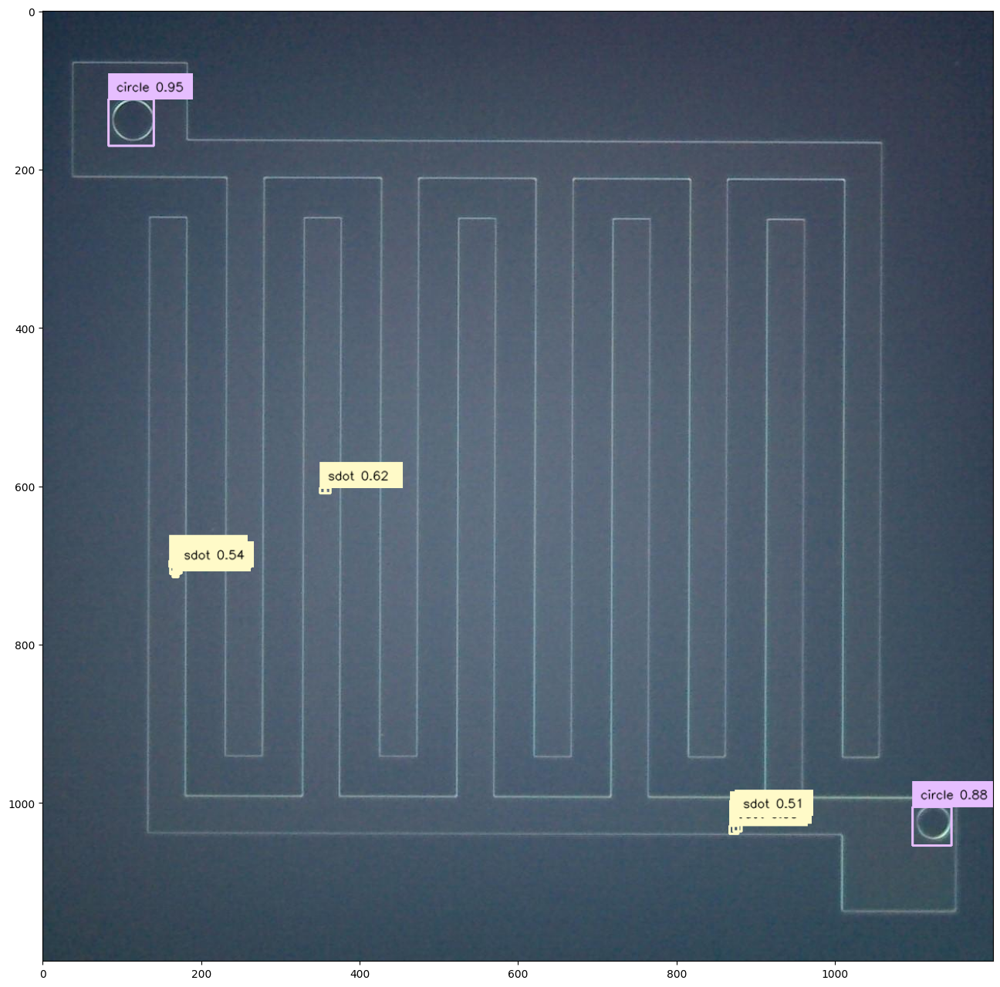

In [ ]:
# 한 장씩 predict

import random
import cv2
import numpy as np
import supervision as sv
from tqdm.notebook import tqdm

# 무작정 이미지를 골라 어노테이션하는 부분

# utils
categories = TEST_DATASET.coco.cats
id2label = {k: v['name'] for k,v in categories.items()}
box_annotator = sv.BoxAnnotator()

# select random image
image_ids = TEST_DATASET.coco.getImgIds()
image_id = random.choice(image_ids)
print('Image #{}'.format(image_id))

# load image and annotatons
image = TEST_DATASET.coco.loadImgs(image_id)[0]
annotations = TEST_DATASET.coco.imgToAnns[image_id]
image_path = os.path.join(TEST_DATASET.root, image['file_name'])
image = cv2.imread(image_path)

# ground truth 출력하는 부분
# # annotate
# detections = sv.Detections.from_coco_annotations(coco_annotation=annotations)
# labels = [f"{id2label[class_id]}" for _, _, class_id, _ in detections]
# frame = box_annotator.annotate(scene=image.copy(), detections=detections, labels=labels)

# # annotate
# xyxy = np.array([[ann['bbox'][0], ann['bbox'][1], ann['bbox'][0] + ann['bbox'][2], ann['bbox'][1] + ann['bbox'][3]] for ann in annotations])
# confidence = None  # or you can provide confidence values if available
# class_id = np.array([ann['category_id'] for ann in annotations])
# tracker_id = None  # or you can provide tracker ids if available

# detections = sv.Detections(
#     xyxy=xyxy,
#     confidence=confidence,
#     class_id=class_id,
#     tracker_id=tracker_id,
# )

# labels = [f"{id2label[class_id]}" for class_id in class_id]
# frame = box_annotator.annotate(scene=image.copy(), detections=detections, labels=labels)


# print('ground truth')
# %matplotlib inline
# sv.show_frame_in_notebook(frame, (16, 16))


#
# inference
with torch.no_grad():
    # load image and predict
    inputs = image_processor(images=image, return_tensors='pt').to(DEVICE)
    outputs = model(**inputs)

    # post-process
    target_sizes = torch.tensor([image.shape[:2]]).to(DEVICE)
    results = image_processor.post_process_object_detection(
        outputs=outputs,
        threshold=CONFIDENCE_THRESHOLD,
        target_sizes=target_sizes
    )[0]

# annotate
detections = sv.Detections.from_transformers(transformers_results=results).with_nms(threshold=0.5)    # 원래 IOU_THRESHOLD -> 중첩 박스 때문에 0.5로 낮춤
labels = [f"{id2label[class_id]} {confidence:.2f}" for _, confidence, class_id, _ in detections]
frame = box_annotator.annotate(scene=image.copy(), detections=detections, labels=labels)

print('detections')
%matplotlib inline
sv.show_frame_in_notebook(frame, (16, 16))

In [ ]:
!rm -r '/content/drive/MyDrive/2nd Project/DETR/output_images'

In [ ]:
# 잘 나오는데 confidence가 안 나옴
import os
from tqdm.notebook import tqdm

TEST_DATASET = CocoDetection(
    image_directory_path=TEST_DIRECTORY,
    image_processor=image_processor,
    train=False)

TEST_DATALOADER = DataLoader(dataset=TEST_DATASET, collate_fn=collate_fn, batch_size=batch_size)

# 폴더 생성
output_folder = "/content/drive/MyDrive/2nd Project/DETR/output_images"
os.makedirs(output_folder, exist_ok=True)

for idx, batch in enumerate(tqdm(TEST_DATALOADER)):
    pixel_values = batch["pixel_values"].to(DEVICE)
    pixel_mask = batch["pixel_mask"].to(DEVICE)
    labels = [{k: v.to(DEVICE) for k, v in t.items()} for t in batch["labels"]]

    with torch.no_grad():
        outputs = model(pixel_values=pixel_values, pixel_mask=pixel_mask)

    orig_target_sizes = torch.stack([target["orig_size"] for target in labels], dim=0)
    results = image_processor.post_process_object_detection(outputs, target_sizes=orig_target_sizes)

    for i, result in enumerate(results):
        image_id = labels[i]["image_id"].item()
        image = cv2.imread(os.path.join(TEST_DATASET.root, TEST_DATASET.coco.imgs[image_id]['file_name']))

        # Get annotations for the current image
        annotations = TEST_DATASET.coco.imgToAnns[image_id]

        # Create xyxy, confidence, and class_id arrays
        xyxy = np.array([[ann['bbox'][0], ann['bbox'][1], ann['bbox'][0] + ann['bbox'][2], ann['bbox'][1] + ann['bbox'][3]] for ann in annotations])
        xyxy = xyxy.reshape(-1, 4)
        confidence = None  # or you can provide confidence values if available
        class_id = np.array([ann['category_id'] for ann in annotations])
        class_id = class_id.reshape(-1)
        tracker_id = None  # or you can provide tracker ids if available

        # print(f"xyxy 형태: {xyxy.shape}")
        # print(f"confidence 형태: {confidence.shape if confidence is not None else None}")
        # print(f"class_id 형태: {class_id.shape}")
        # print(f"tracker_id 형태: {tracker_id.shape if tracker_id is not None else None}")

        detections = sv.Detections(
            xyxy=xyxy,
            confidence=confidence,
            class_id=class_id,
            tracker_id=tracker_id,
        )

        labels_text = [f"{id2label[class_id]} {confidence[i]:.2f}" if confidence is not None else f"{id2label[class_id]}" for i, class_id in enumerate(class_id)]
        frame = box_annotator.annotate(scene=image.copy(), detections=detections, labels=labels_text)

        # 이미지 파일로 저장
        output_path = os.path.join(output_folder, f"image_{image_id}_with_bboxes.jpg")
        cv2.imwrite(output_path, frame)

print("Bounding box images saved to the output folder.")

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!


  0%|          | 0/26 [00:00<?, ?it/s]

Bounding box images saved to the output folder.


In [ ]:
!zip -r output_images.zip /content/drive/MyDrive/2nd\ Project/DETR/output_images
from google.colab import files
files.download('/content/output_images.zip')

  adding: content/drive/MyDrive/2nd Project/DETR/output_images/ (stored 0%)
  adding: content/drive/MyDrive/2nd Project/DETR/output_images/image_93_with_bboxes.jpg (deflated 10%)
  adding: content/drive/MyDrive/2nd Project/DETR/output_images/image_62_with_bboxes.jpg (deflated 8%)
  adding: content/drive/MyDrive/2nd Project/DETR/output_images/image_60_with_bboxes.jpg (deflated 7%)
  adding: content/drive/MyDrive/2nd Project/DETR/output_images/image_0_with_bboxes.jpg (deflated 8%)
  adding: content/drive/MyDrive/2nd Project/DETR/output_images/image_69_with_bboxes.jpg (deflated 9%)
  adding: content/drive/MyDrive/2nd Project/DETR/output_images/image_87_with_bboxes.jpg (deflated 8%)
  adding: content/drive/MyDrive/2nd Project/DETR/output_images/image_88_with_bboxes.jpg (deflated 8%)
  adding: content/drive/MyDrive/2nd Project/DETR/output_images/image_49_with_bboxes.jpg (deflated 9%)
  adding: content/drive/MyDrive/2nd Project/DETR/output_images/image_82_with_bboxes.jpg (deflated 8%)
  addi

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
test_image_files[0]

'pattern_1-1-2-8-D_jpg.rf.0d16cafc219a22024943a92818dd5569.jpg'

위 코드에 대한 설명

오류를 해결하기 위해 다시 한번 Detections 클래스를 초기화할 때 전달되는 인자들의 형태를 확인해봅시다.

오류 메시지를 보면 다음과 같은 조건을 만족해야 합니다:

xyxy: 2D np.ndarray, shape (n, 4)
confidence: None 또는 1D np.ndarray, shape (n,)
class_id: 1D np.ndarray, shape (n,)
tracker_id: None 또는 1D np.ndarray, shape (n,)
먼저, xyxy, confidence, class_id, tracker_id의 현재 형태를 출력하여 확인해보겠습니다:

각각의 형태를 확인한 후, 필요한 경우에는 데이터의 형태를 맞춰줄 필요가 있습니다. 예를 들어, 만약 데이터가 현재 요구되는 형태와 일치하지 않는다면, 해당 데이터를 2D 또는 1D np.ndarray로 변환해주어야 합니다. 이렇게 데이터의 형태를 변경하여 Detections 클래스를 초기화하면 오류를 해결할 수 있습니다.

각각의 인자들의 shape가 (0,)으로 출력되었기 때문에, 추론 결과인 results에 객체가 감지되지 않았음을 알 수 있습니다. 이 경우, 객체 감지 결과가 없기 때문에 아무런 객체를 찾지 못했다는 뜻입니다. 따라서 이 문제를 해결하려면, 아래와 같은 두 가지 경우를 고려해야 합니다:

객체 감지 결과가 없는 경우 (객체를 찾지 못한 경우):

이 경우, 이미지에 객체가 없거나, 모델이 객체를 감지하지 못한 경우입니다.
객체 감지 결과가 없는 경우, 따로 처리를 해주어야 합니다. 예를 들어, 해당 이미지에 대한 로그를 출력하거나 결과를 저장할 때 "No object detected."와 같은 메시지를 출력하거나 기록하는 것이 가능합니다.
객체 감지 결과가 있는 경우:

만약 객체 감지 결과가 있는 경우, 해당 객체의 정보를 가지고 Detections 클래스를 초기화하고, 결과를 시각화하여 저장하는 작업을 수행해야 합니다.
따라서, 코드에서 추론 결과를 확인하고 처리하는 부분을 아래와 같이 수정해보세요:

## Evaluation on test dataset

Finally, we evaluate the model on the `TEST_DATASET`. For this we make use of the `CocoEvaluator` class available in a tiny [PyPi package](https://github.com/NielsRogge/coco-eval) made by [Niels Rogge](https://github.com/NielsRogge) . This class is entirely based on the [original evaluator](https://github.com/facebookresearch/detr/blob/main/datasets/coco_eval.py) class used by the DETR authors.

In [ ]:
!pip install -q coco_eval

  Preparing metadata (setup.py) ... done


In [ ]:
def convert_to_xywh(boxes):
    xmin, ymin, xmax, ymax = boxes.unbind(1)
    return torch.stack((xmin, ymin, xmax - xmin, ymax - ymin), dim=1)

def prepare_for_coco_detection(predictions):
    coco_results = []
    for original_id, prediction in predictions.items():
        if len(prediction) == 0:
            continue

        boxes = prediction["boxes"]
        boxes = convert_to_xywh(boxes).tolist()
        scores = prediction["scores"].tolist()
        labels = prediction["labels"].tolist()

        coco_results.extend(
            [
                {
                    "image_id": original_id,
                    "category_id": labels[k],
                    "bbox": box,
                    "score": scores[k],
                }
                for k, box in enumerate(boxes)
            ]
        )
    return coco_results

In [ ]:
from coco_eval import CocoEvaluator
from tqdm.notebook import tqdm

import numpy as np

evaluator = CocoEvaluator(coco_gt=TEST_DATASET.coco, iou_types=["bbox"])

print("Running evaluation...")

for idx, batch in enumerate(tqdm(TEST_DATALOADER)):
    pixel_values = batch["pixel_values"].to(DEVICE)
    pixel_mask = batch["pixel_mask"].to(DEVICE)
    labels = [{k: v.to(DEVICE) for k, v in t.items()} for t in batch["labels"]]

    with torch.no_grad():
      outputs = model(pixel_values=pixel_values, pixel_mask=pixel_mask)

    orig_target_sizes = torch.stack([target["orig_size"] for target in labels], dim=0)
    results = image_processor.post_process_object_detection(outputs, target_sizes=orig_target_sizes)

    predictions = {target['image_id'].item(): output for target, output in zip(labels, results)}
    predictions = prepare_for_coco_detection(predictions)
    evaluator.update(predictions)

evaluator.synchronize_between_processes()
evaluator.accumulate()
evaluator.summarize()

# IoU=0.50 임계값 50에 전체 IoU는 0.421임

Running evaluation...


  0%|          | 0/34 [00:00<?, ?it/s]

Accumulating evaluation results...
DONE (t=0.16s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.098
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.225
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.063
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.077
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.134
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.038
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.066
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.142
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.144
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.105
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.186
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

## Save and load model

In [ ]:
import os
import shutil

source_folder_1 = '/content/custom-model'
source_folder_2 = '/content/lightning_logs'
destination_folder = '/content/drive/MyDrive/2nd Project/DETR/save_model'

# custom-model 폴더가 생기면서 저장됨
model.model.save_pretrained(source_folder_1)

# Ensure the destination folder exists, create it if not present
os.makedirs(destination_folder, exist_ok=True)

# Copy the contents of source_folder_1 to the destination folder
shutil.copytree(source_folder_1, os.path.join(destination_folder, 'custom-model'))

# Copy the contents of source_folder_2 to the destination folder
shutil.copytree(source_folder_2, os.path.join(destination_folder, 'lightning_logs'))

In [ ]:
# model = DetrForObjectDetection.from_pretrained(MODEL_PATH)
# model.to(DEVICE)
model = DetrForObjectDetection.from_pretrained('/content/drive/MyDrive/2nd Project/Co-DETR/save_model/custom-model 2 (epoch=100)')
model.to(DEVICE)

DetrForObjectDetection(
  (model): DetrModel(
    (backbone): DetrConvModel(
      (conv_encoder): DetrConvEncoder(
        (model): FeatureListNet(
          (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
          (bn1): DetrFrozenBatchNorm2d()
          (act1): ReLU(inplace=True)
          (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
          (layer1): Sequential(
            (0): Bottleneck(
              (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
              (bn1): DetrFrozenBatchNorm2d()
              (act1): ReLU(inplace=True)
              (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (bn2): DetrFrozenBatchNorm2d()
              (drop_block): Identity()
              (act2): ReLU(inplace=True)
              (aa): Identity()
              (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      